# Value, Value per sqm, and Neighbourhgood Analysis

In [26]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from IPython.display import display, HTML

from utils import get_data

pd.set_option('display.max_columns', None)

In [21]:
def folium_deepnote_show(m):
    data = m.get_root().render()
    data_fixed_height = data.replace('width: 100%;height: 100%', 'width: 100%').replace('height: 100.0%;', 'height: 609px;', 1)
    display(HTML(data_fixed_height))

In [8]:
df = get_data()

IQR: 5775 | Actual: 6268 | 92.13%
IQR: 5999 | Actual: 6268 | 95.71%
Total different flats:  (4438, 95)


In [9]:
stat = df.groupby('level7')['value'].agg(['mean', 'count', 'sum']).rename(columns={"sum":"value_sum","mean":"value_mean"})
stat_value = df.groupby('level7')['surface'].agg(['sum','mean']).rename(columns={"sum":"sqm_sum", "mean":"sqm_mean"})
stat_sqm = pd.merge(stat, stat_value, on='level7')
stat_sqm["value_per_sqm"] = stat_sqm["value_sum"] / stat_sqm["sqm_sum"]
stat_sqm.sort_values("value_per_sqm", ascending=False)

,value_mean,count,value_sum,sqm_sum,sqm_mean,value_per_sqm
level7,,,,,,
Eixample,607107.551383,1012,614392842,108604,107.316206,5657.184284
Sarrià - Sant Gervasi,779571.394872,390,304032844,57275,146.858974,5308.299328
Les Corts,620701.990050,201,124761100,23593,117.378109,5288.055779
Gràcia,523886.678808,302,158213777,32303,106.963576,4897.804445
Ciutat Vella,436230.173973,730,318448027,65431,89.631507,4866.928933
Sant Martí,411969.790170,529,217932019,47274,89.364839,4609.976287
Sants - Montjuïc,300098.408759,411,123340446,32296,78.579075,3819.062608
Horta - Guinardó,343868.261128,337,115883604,30486,90.462908,3801.207243
Sant Andreu,330817.416667,240,79396180,22082,92.008333,3595.515805


In [10]:
stat = df.groupby(['level8','level7'])['value'].agg(['mean', 'count', 'sum']).rename(columns={"sum":"value_sum","mean":"value_mean"})
stat_value = df.groupby(['level8','level7'])['surface'].agg(['sum','mean']).rename(columns={"sum":"sqm_sum", "mean":"sqm_mean"})
stat_sqm = pd.merge(stat, stat_value, on=['level8','level7'])
stat_sqm["value_per_sqm"] = stat_sqm["value_sum"] / stat_sqm["sqm_sum"]
stat_sqm.sort_values("value_per_sqm", ascending=False).head(5)


,,value_mean,count,value_sum,sqm_sum,sqm_mean,value_per_sqm
level8,level7,,,,,,
Diagonal Mar i el Front Marítim del Poblenou,Sant Martí,677329.268293,82,55541000,8137,99.231707,6825.734300
Sarrià,Sarrià - Sant Gervasi,758714.285714,35,26555000,3988,113.942857,6658.726179
La Clota,Horta - Guinardó,483166.666667,6,2899000,447,74.500000,6485.458613
Dreta de l'Eixample,Eixample,781406.137184,277,216449500,33383,120.516245,6483.824102
Pedralbes,Les Corts,919185.185185,54,49636000,8059,149.240741,6159.076809


In [11]:
# Calculating the deviation from general mean
value_general_mean = np.mean(df.value)
surface_general_mean = np.mean(df.surface)
stat_sqm["dev_value_general"] = stat_sqm["value_mean"] / value_general_mean
stat_sqm["dev_surface_general"] = stat_sqm["sqm_mean"] / surface_general_mean
stat_sqm["diff_ratios_unfairness"] = stat_sqm["dev_value_general"] / stat_sqm["dev_surface_general"]
stat_sqm = stat_sqm.sort_values("diff_ratios_unfairness", ascending=False)
stat_sqm[["value_mean","sqm_mean","value_per_sqm","dev_value_general","dev_surface_general", "diff_ratios_unfairness"]].head()


,,value_mean,sqm_mean,value_per_sqm,dev_value_general,dev_surface_general,diff_ratios_unfairness
level8,level7,,,,,,
Diagonal Mar i el Front Marítim del Poblenou,Sant Martí,677329.268293,99.231707,6825.734300,1.418860,0.996291,1.424142
Sarrià,Sarrià - Sant Gervasi,758714.285714,113.942857,6658.726179,1.589344,1.143991,1.389297
La Clota,Horta - Guinardó,483166.666667,74.500000,6485.458613,1.012131,0.747983,1.353146
Dreta de l'Eixample,Eixample,781406.137184,120.516245,6483.824102,1.636878,1.209988,1.352805
Pedralbes,Les Corts,919185.185185,149.240741,6159.076809,1.925496,1.498383,1.285049


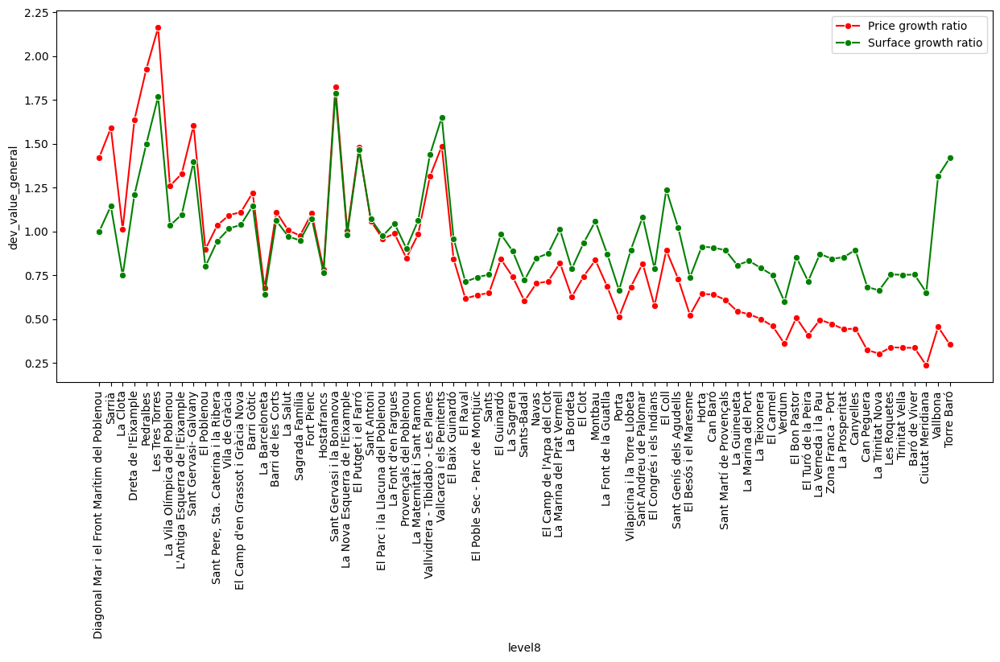

In [12]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.lineplot(data=stat_sqm, x="level8", y="dev_value_general", marker='o', label="Price growth ratio", color="red")
sns.lineplot(data=stat_sqm, x="level8", y="dev_surface_general", marker='o', label="Surface growth ratio", color="green")
plt.legend()
plt.xticks(rotation=90)
plt.show()

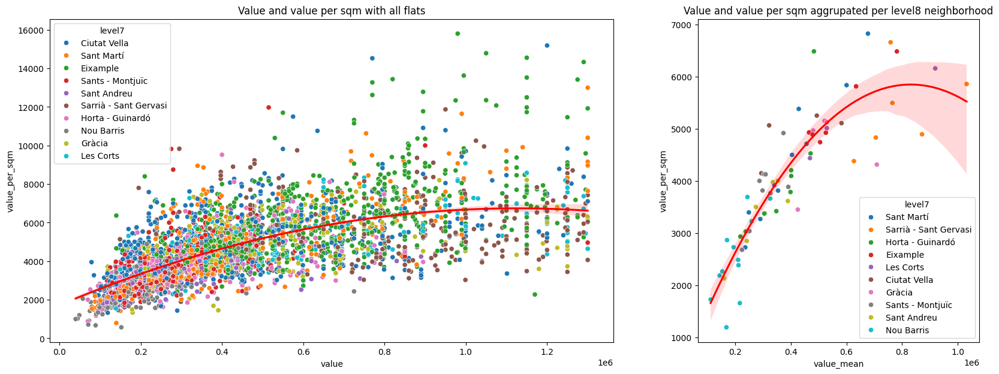

In [13]:
df["value_per_sqm"] = df["value"] / df["surface"]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 7), gridspec_kw={'width_ratios': [2, 1]})
sns.scatterplot(data=df, x="value", y="value_per_sqm", hue="level7", ax=ax[0])
sns.regplot(data=df, x='value', y='value_per_sqm', scatter=False, color='red', order=2, label='Trendline', ax=ax[0])
ax[0].set_title("Value and value per sqm with all flats")

sns.scatterplot(data=stat_sqm, x="value_mean", y="value_per_sqm", hue="level7", ax=ax[1])
sns.regplot(data=stat_sqm, x='value_mean', y='value_per_sqm', scatter=False, color='red', order=2, label='Trendline', ax=ax[1])
ax[1].set_title("Value and value per sqm aggrupated per level8 neighborhood")
plt.show()

In [14]:
def get_color(value, min_val, max_val):
    # Normalize the value
    normalized = (value - min_val) / (max_val - min_val)
    # normalized = (np.log(value) - np.log(min_val)) / (np.log(max_val) - np.log(min_val))
    # Calculate RGB values
    r = int(255 * (1 - normalized))
    g = int(255 * normalized)
    b = 0
    # Convert to hexadecimal format
    color = '#{:02x}{:02x}{:02x}'.format(r, g, b)
    return color

In [37]:
import folium

# Find the min and max values of 'value' in your DataFrame
min_value = df['value'].min()
max_value = df['value'].max()

# Create a map centered around Barcelona
m = folium.Map(location=[41.3851, 2.1734], zoom_start=13, tiles='cartodbpositron')

# Add CircleMarkers for each location with color based on NumericalFeature
for index, row in df.iterrows():
    fill_color = get_color(row['value'], max_value, min_value)
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # Adjust the radius of the circle marker
        popup=row['value'],
        fill=True,
        fill_color=fill_color,
        color=None,
        fill_opacity=0.7
    ).add_to(m)

m

In [30]:
import requests
import ast
import geopandas as gpd

url = "https://opendata-ajuntament.barcelona.cat/data/api/action/datastore_search?resource_id=b21fa550-56ea-4f4c-9adc-b8009381896e"
response = requests.get(url)
data = response.json()
records = data["result"]["records"]
hoods = pd.DataFrame(records)
hoods['geometry'] = gpd.GeoSeries.from_wkt(hoods['geometria_wgs84'])
my_geo_df = gpd.GeoDataFrame(hoods, geometry='geometry')


In [31]:
from fuzzywuzzy import process

def merge_geodf_with_data(geo_df, column_geodf, data, column_data):
    unique_values_df1 = geo_df[column_geodf].unique()
    unique_values_df2 = data[column_data].unique()

    matches = {}
    for value in unique_values_df1:
        matches[value] = process.extractOne(value, unique_values_df2)[0] #find_most_similar(value, unique_values_df2)
    
    matches_df = pd.DataFrame(matches.items(), columns=[column_geodf, column_data])
    
    my_geo_df_names = pd.merge(geo_df, matches_df, on=column_geodf)
    merged = pd.merge(my_geo_df_names, data, on=column_data)

    return merged

value_hood = merge_geodf_with_data(my_geo_df, "nom_barri", stat_sqm.reset_index()[["level8","value_mean"]], "level8")
value_per_sqm_hood = merge_geodf_with_data(my_geo_df, "nom_barri", stat_sqm.reset_index()[["level8","value_per_sqm","diff_ratios_unfairness"]], "level8")


In [38]:
import folium
import branca.colormap as cm

min_value = value_hood['value_mean'].min()
max_value = value_hood['value_mean'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_hood.iterrows():
    color = colormap(row["value_mean"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(row["level8"]))

    m.add_child(polygon)
colormap.caption = 'Average Value'
m.add_child(colormap)


In [39]:
min_value = value_per_sqm_hood['value_per_sqm'].min()
max_value = value_per_sqm_hood['value_per_sqm'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_per_sqm_hood.iterrows():
    color = colormap(row["value_per_sqm"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(row["level8"]))

    m.add_child(polygon)
colormap.caption = 'Value per sqm'
m.add_child(colormap)


In [40]:
min_value = value_per_sqm_hood['diff_ratios_unfairness'].min()
max_value = value_per_sqm_hood['diff_ratios_unfairness'].max()

m = folium.Map([41.3851, 2.1734], zoom_start=12, tiles="cartodbpositron")
colormap = cm.LinearColormap(['green', 'yellow', 'red'], vmin=min_value, vmax=max_value)


for index, row in value_per_sqm_hood.iterrows():
    color = colormap(row["diff_ratios_unfairness"])
    polygon = folium.GeoJson(row["geometry"],
                              style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 1, 'fillOpacity': 0.7})
    polygon.add_child(folium.Popup(row["level8"]))

    m.add_child(polygon)
colormap.caption = 'Unfairness'
m.add_child(colormap)
